# Sensor Body Frame Registration 2 (cont'd)

V&V of the static registration zones!

Using the new architecture, import short and long session data to fine tune the coarse and fine ranges for still motion/lift peak. 

## Steps (and why it takes long)

1. decode all device data
2. compute processed signals for tile
3. create continuous tile euler signals to correct zero crossing errors affecting future stillness calcs
4. run a coarse detection for lift peak zones
5. run a fine still detection to identify any valid registration zones
6. compute the avg quaternion inside these fine zones to transform sensor into boot frame
7. assign all static registrations with timestamps (tail of zone) and associated ranges

To get valid boot orientations throughout the session, grab the most recent static registration to transform the sensor orientation signals.

In [1]:
from sessions import Session_2023_12_30, Session_2023_12_31

In [2]:
session_2023_12_30 = Session_2023_12_30()
session_2023_12_31 = Session_2023_12_31(print_out=True)

Computing orientation for <imu.IMU object at 0x00000253F1155E80>
Translating orientation into euler data for <imu.IMU object at 0x00000253F1155E80>
Making signal continuous based on FS range: 360
makeContinuousRange() progress 5 %
makeContinuousRange() progress 10 %
makeContinuousRange() progress 15 %
makeContinuousRange() progress 20 %
makeContinuousRange() progress 25 %
makeContinuousRange() progress 30 %
makeContinuousRange() progress 35 %
makeContinuousRange() progress 40 %
makeContinuousRange() progress 45 %
makeContinuousRange() progress 50 %
makeContinuousRange() progress 55 %
makeContinuousRange() progress 60 %
makeContinuousRange() progress 65 %
makeContinuousRange() progress 70 %
makeContinuousRange() progress 75 %
makeContinuousRange() progress 80 %
makeContinuousRange() progress 85 %
makeContinuousRange() progress 90 %
makeContinuousRange() progress 95 %
makeContinuousRange() progress 100 %
makeContinuousRange() skips found: 589
Making signal continuous based on FS range: 3

fine_rs: [[93927, 96032], [161887, 170666]]
coarse_rs: [[91983, 97773], [153949, 171279]]


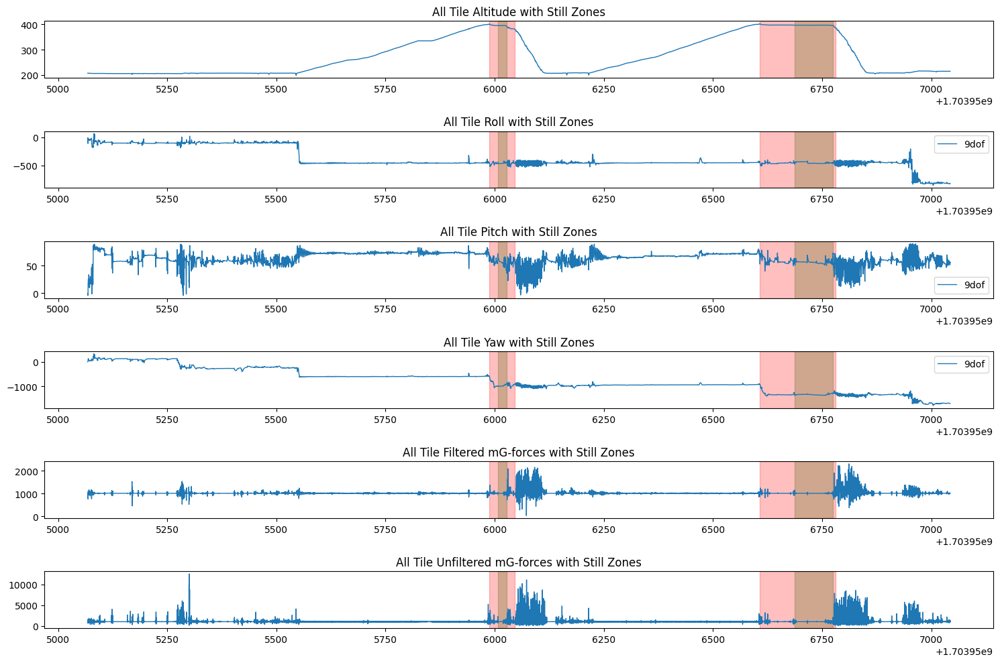

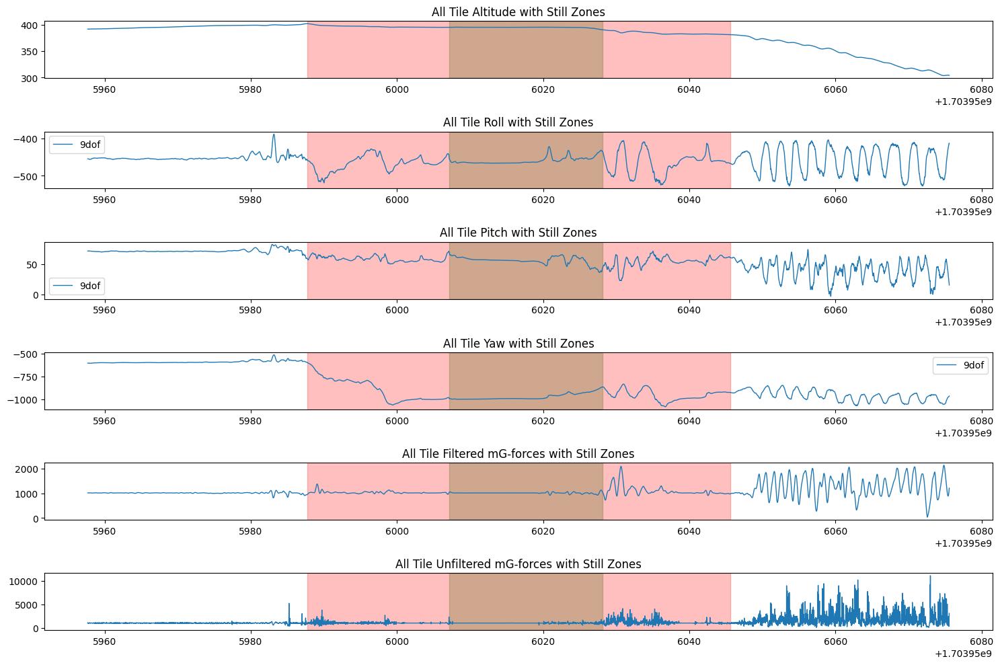

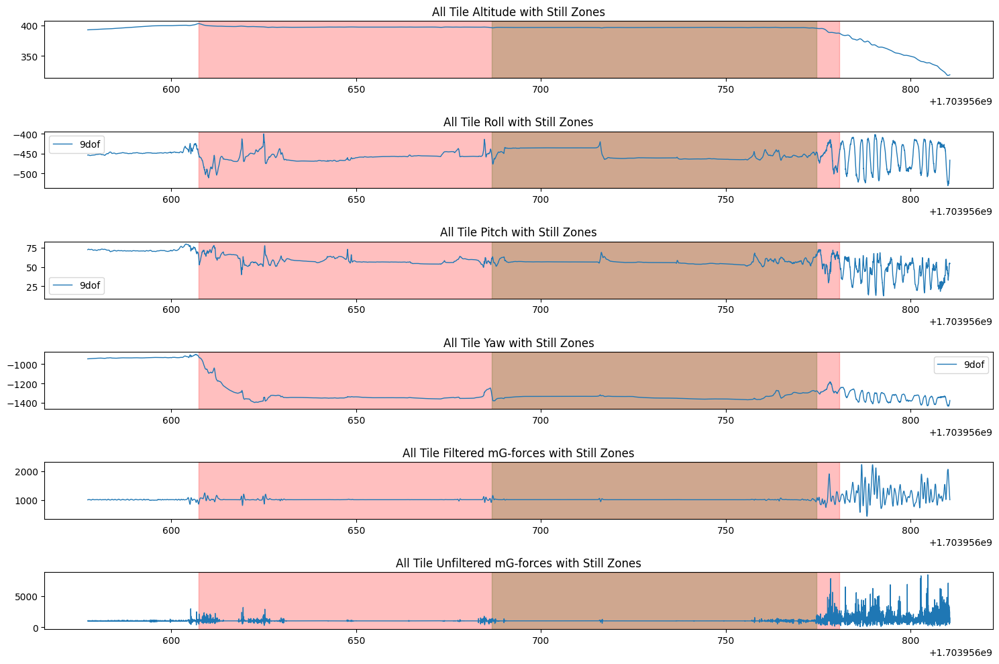

In [3]:
from plotting import plotAllTileRegistationZones

fine_rs = [r for r in session_2023_12_30.tile.static_registration.ranges if r is not None]
coarse_rs = session_2023_12_30.tile.static_registration.coarse_ranges
print('fine_rs:', fine_rs)
print('coarse_rs:', coarse_rs)

plotAllTileRegistationZones(session_2023_12_30.tile)

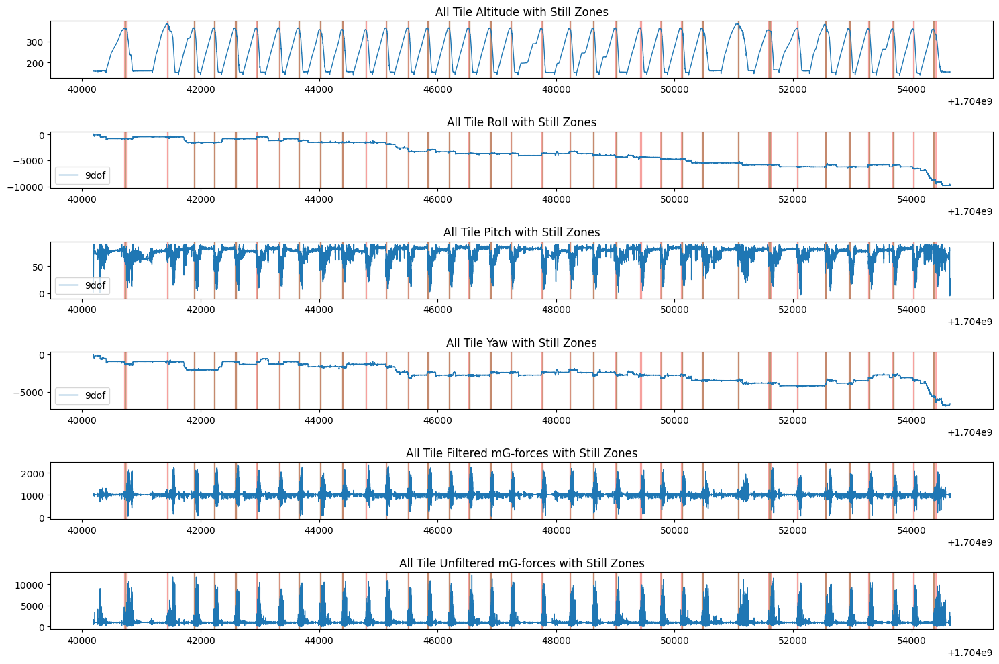

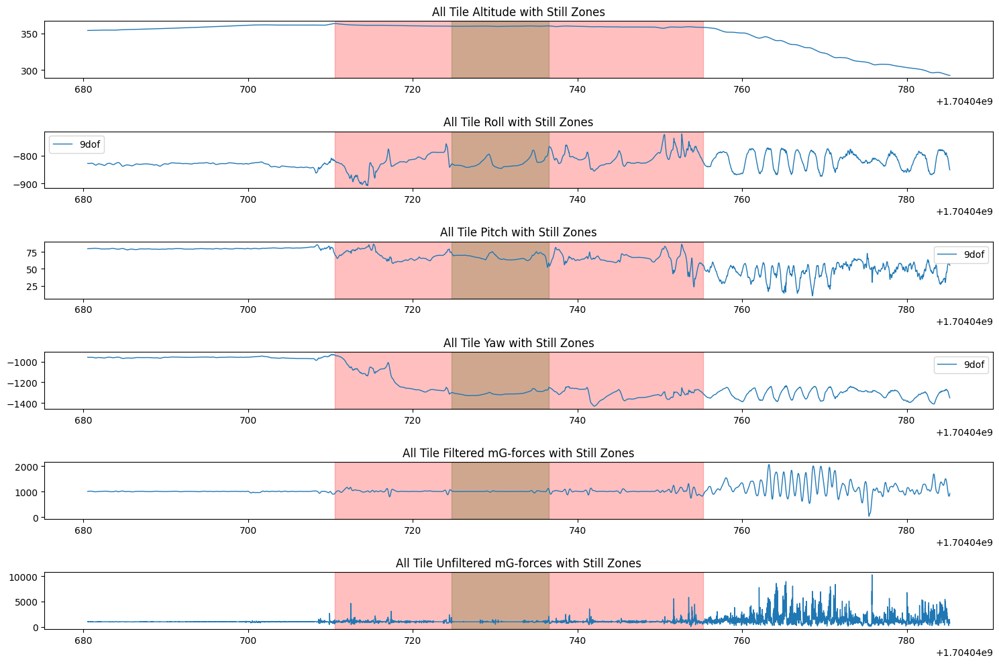

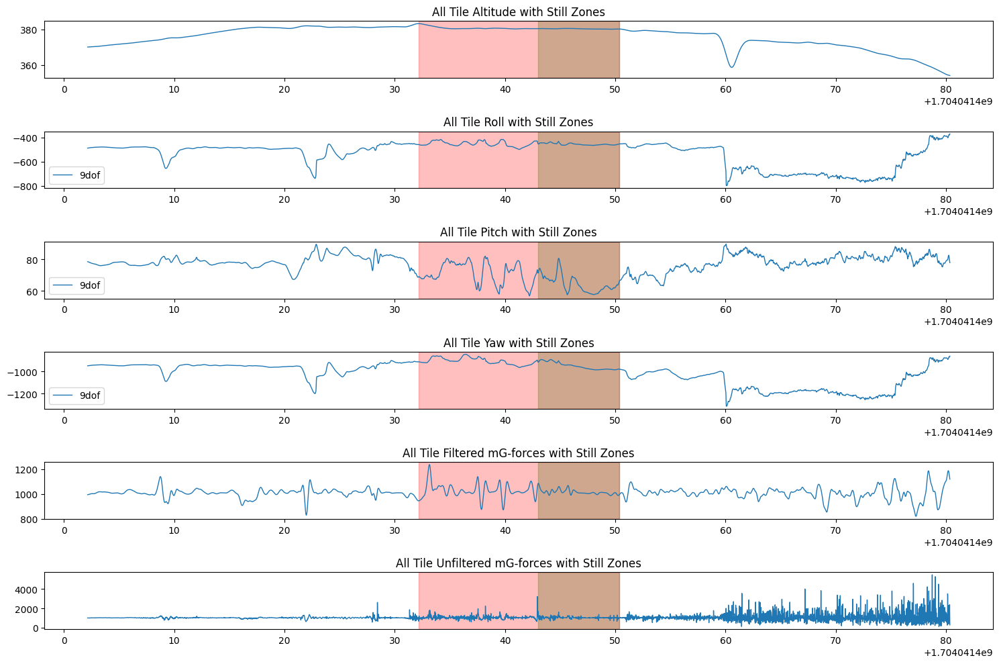

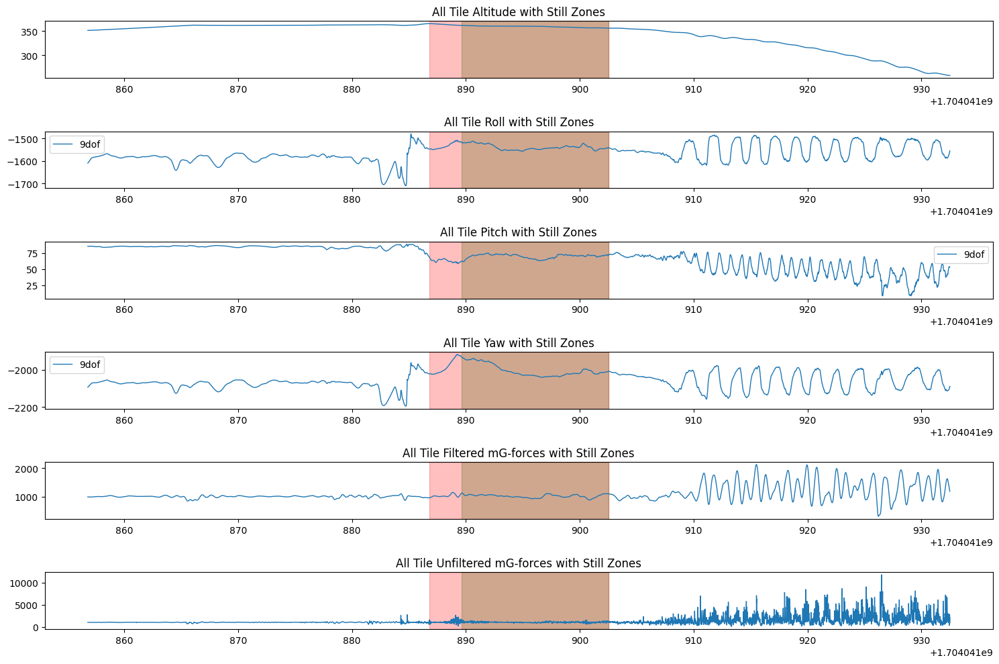

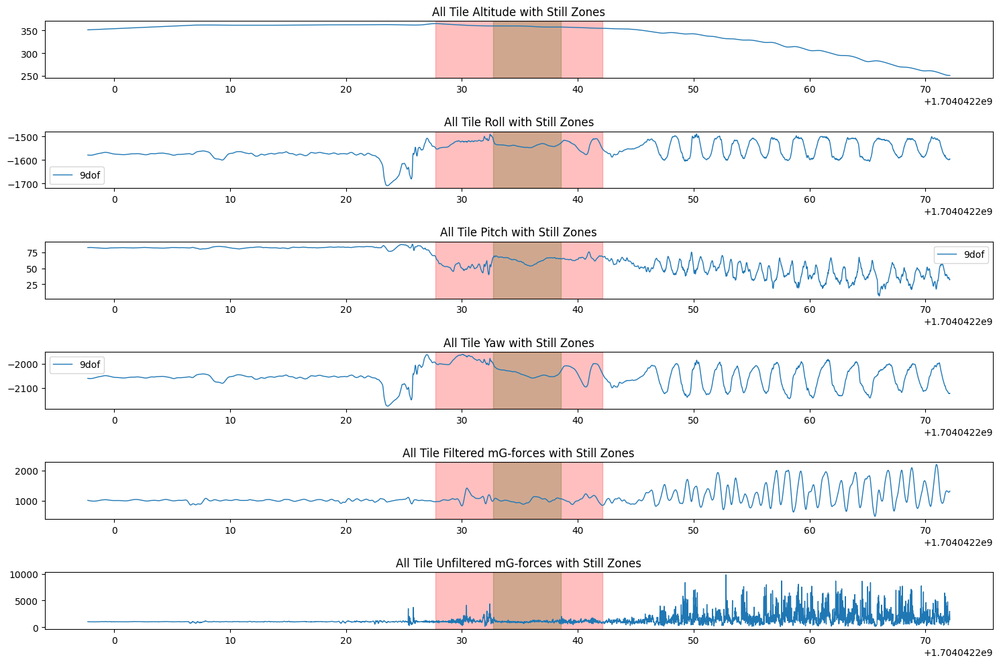

...

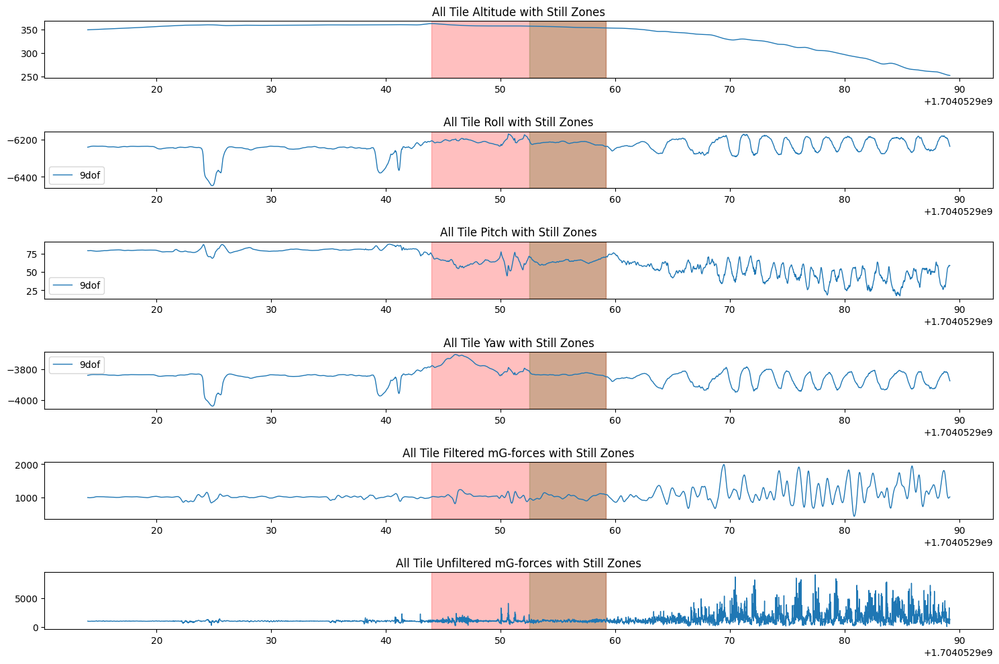

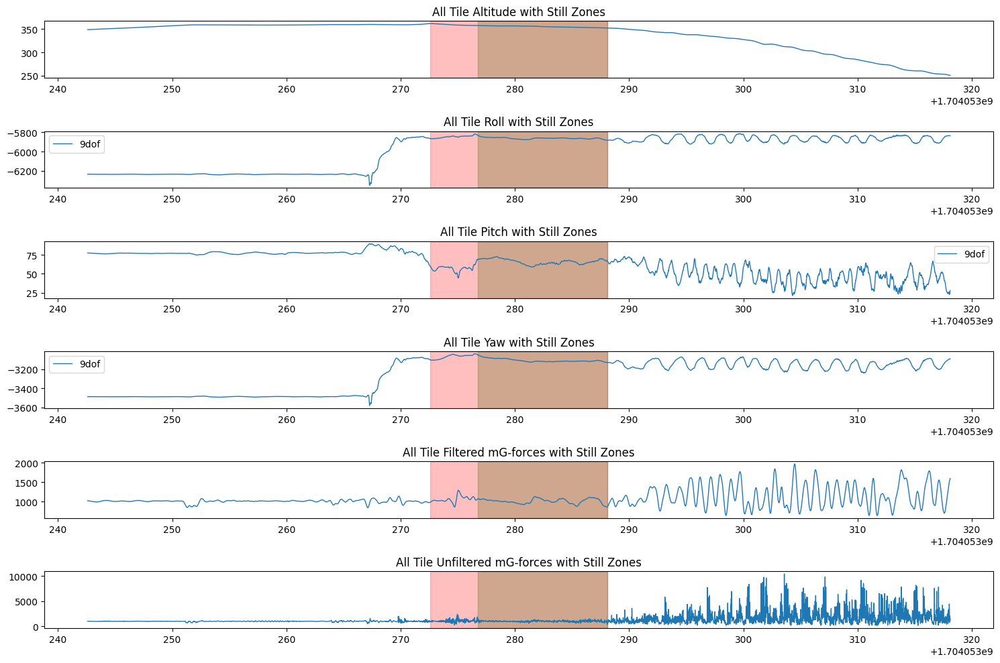

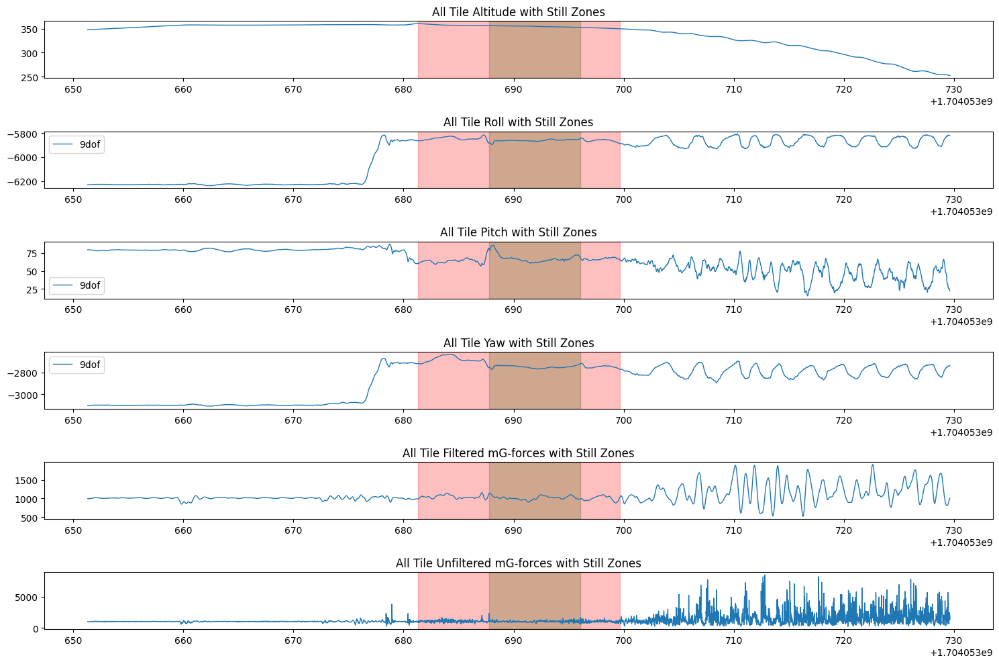

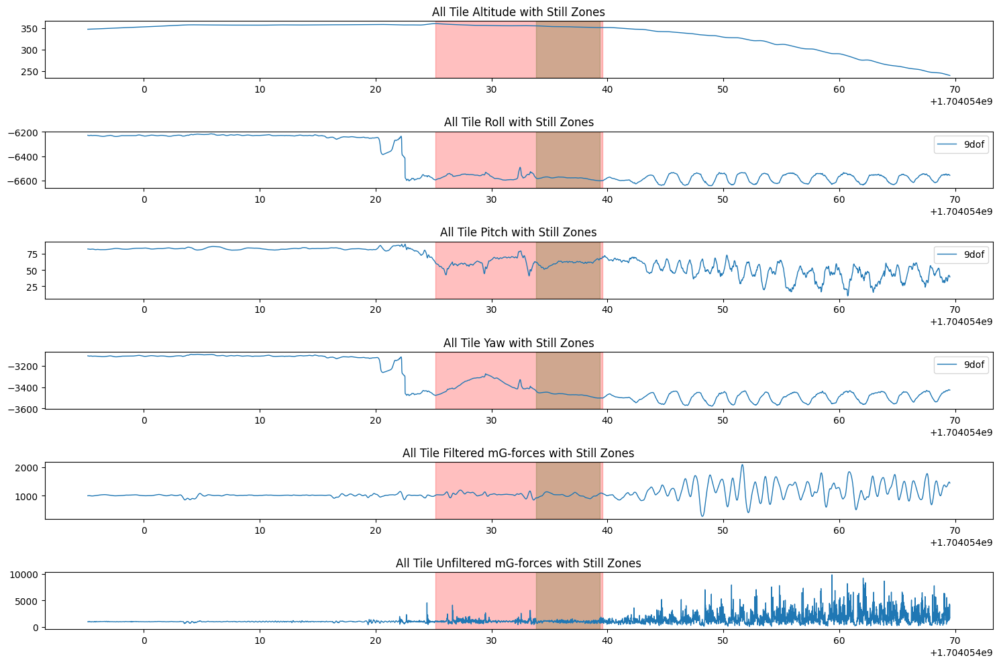

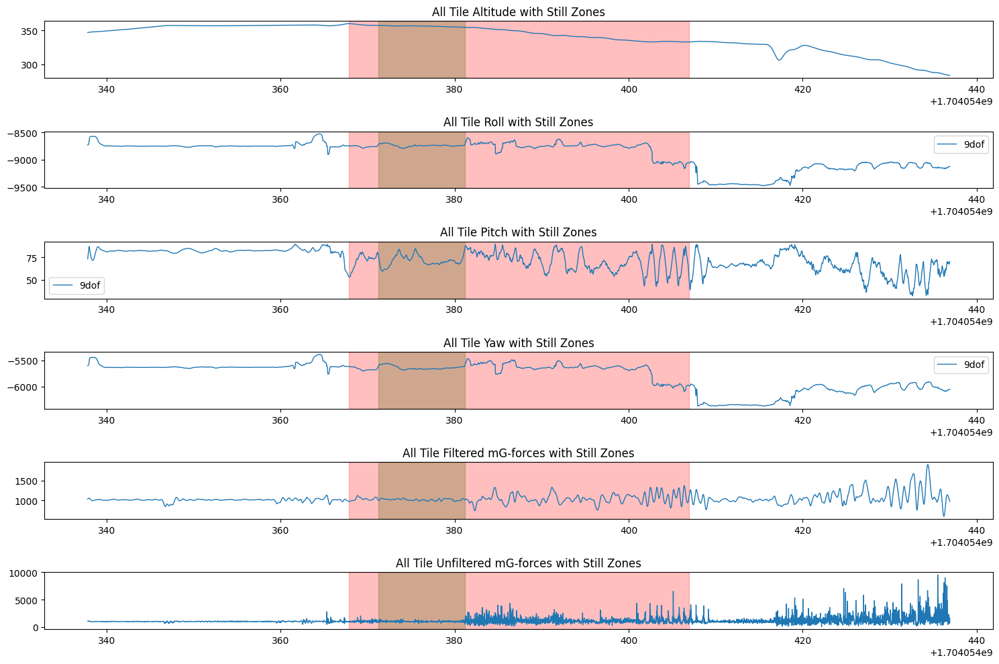

In [4]:
plotAllTileRegistationZones(session_2023_12_31.tile)

In [5]:
print('Avg Quat', ['W','X','Y','Z'])
_ = [print(reg.avg_quat) for reg in session_2023_12_31.tile.static_registration.registrations if reg is not None]

Avg Quat ['W', 'X', 'Y', 'Z']
[-0.21348588 -0.57430301 -0.47648464  0.63052535]
[-0.11519142 -0.60367529 -0.41323679  0.67196908]
[-0.3218849  -0.49945934 -0.52920215  0.60570254]
[-0.05744767 -0.62550116 -0.38599856  0.67561319]
[ 0.14243323  0.64078455  0.36371556 -0.66092278]
[-0.05248404 -0.63127913 -0.39885744  0.66305718]
[ 0.19530805  0.53863534  0.47037747 -0.67117194]
[ 0.18873111  0.58703074  0.4585976  -0.63989352]
[ 0.28247449  0.44842428  0.59943091 -0.59983865]
[ 0.0038153   0.69665577  0.21077566 -0.68573304]
[-0.15475316 -0.63506086 -0.37783812  0.65573434]
[-0.16169274 -0.56755115 -0.46067359  0.6629638 ]
[-0.44444379 -0.30242172 -0.58494519  0.60733017]
[ 0.55403313  0.15906455  0.70247557 -0.41746117]
[ 0.10234788  0.60080059  0.42109969 -0.67174296]
[ 0.02549484 -0.70387126 -0.18431374  0.68552441]
[ 0.02645739  0.64749665  0.32682119 -0.68792151]
[ 0.09982186  0.61875773  0.4100877  -0.66257267]
[ 0.23465234  0.52166762  0.50849113 -0.64361319]
[ 0.25829661  0.5259